In [22]:
# %matplotlib notebook
from pymisca.util import *
from pymisca.vis_util import *
import IPython.display as ipd

import KBs
reload(KBs)
import random
import workers

DIR = 'data_pdist'
CDIR ='/home/shouldsee/remote/fg368/repos/cache'

In [3]:
tst_dct = [{'family':'2dntca','rulestr':x[1]} for x in KBs.tst_data]
tst_env = [KBs.guess(dct=x) for x in tst_dct]
tst_out = mp_map(workers.worker0323,tst_dct,n_cpu=12)

print 'finished'

finished


In [23]:
from KBs import *
env = KBs.CA_sys()
hist = sample(env)


In [18]:
%%time
import numpy as np

import matplotlib.pyplot as plt


def showsptime(arr,ax=None,**kwargs):
    if ax is None:
        fig,ax = plt.subplots(1,1,figsize=[12,4])    
    return ax.pcolormesh(sflatten(arr),**kwargs)
import matplotlib.animation as animation
import IPython.display as ipd
def animate(arr,html = 1,nFrame=20):
    '''
    Animate a list of 2d-array
    '''
    fig, ax = plt.subplots()
    im = ax.imshow(arr[0])
    ax.grid()
    data_gen = arr

    def run(data):
        im.set_data(data)
        return im,

    ani = animation.FuncAnimation(fig, run, 
                                  data_gen, 
                                  blit=False,
                                  interval=1000./nFrame,
                                  repeat=1, init_func=None)
    plt.close()
    if html:
        ani = ipd.HTML(ani.to_html5_video())
    return ani
ipd.display(animate(arr)
           )



CPU times: user 7.52 s, sys: 10.2 s, total: 17.7 s
Wall time: 6 s


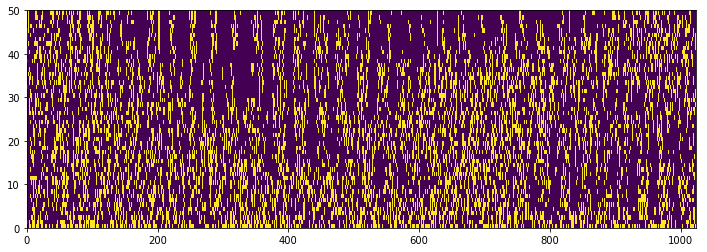

In [45]:
# ipd.display(animate(hist[:,1])
#            )

    
showsptime(hist[:50,0])
plt.show()


In [48]:
def composeF(lst):
    return reduce(lambda f,g: lambda x:g(f(x)),lst,lambda x:x)

In [49]:
kb = KBs.kb_2dntca()

In [74]:
def sample(self,ini=None,adv = None):
    if adv is None:
        adv = self.adv
    if ini is None:
        ini=self.rdf().astype(int)
    avc = ini
    hist = np.zeros((self.hmax,)+avc.shape,dtype=np.int)
    for i in range(self.hmax):
        hist[i]=avc
        avc=(adv(avc)) 
    return hist
def fill_ber(arr,p=0.5):
    return np.random.random(arr.shape) < p
def mix_adv(fA,fB,pa=0):
    if pa==1:
        adv = lambda arr:fA(arr)
    elif pa==0:
        adv = lambda arr:fB(arr)
    else:
        def adv(arr):
            mask = np.random.random(arr.shape)<pa
            A = fA(arr)
            B = fB(arr)
#             arr[mask] = A
#             arr[~mask] = B
            out = A*mask + B*(1-mask)
            return out
#             return arr
    return adv
avc = env.rdf()
fill_ber(avc)
adv = mix_adv(fill_ber,env.adv)
hist = sample(env,adv=adv)

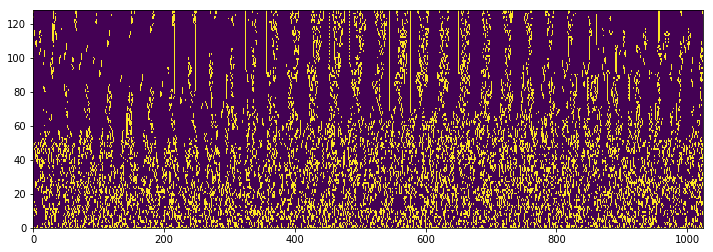

In [66]:
adv = mix_adv(fill_ber,env.adv)
hist = sample(env,adv=adv)
showsptime(hist[:,0])
plt.show()

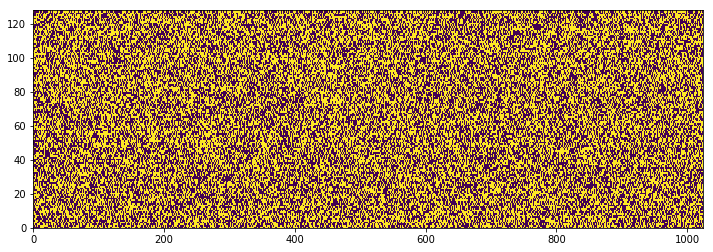

In [67]:
adv = mix_adv(fill_ber,env.adv,pa=1)
hist = sample(env,adv=adv)
showsptime(hist[:,0])
plt.show()

In [126]:
hist = []
ps = np.linspace(1,0,5)
for pr in ps:
#     pr = .5
    pr
    hist += [main(env,silent=1)]
#     plt.figure(figsize=[8,2])
    plt.title('$P_r=%.2f$'%pr)
#     plt.show()

In [134]:
def plot_lines(MEAN,STD,xs=None,ys=None,labels=None,truncate=0,hmap = 1,**kwargs):
    if xs is None:
        xs = np.arange(MEAN.shape[1])
        dx = 1
    else:
        xs = np.array(xs)
        dx = xs[1] - xs[0]
    if ys is None:
        ys = np.arange(MEAN.shape[0])
        dy = 1
    else:
        ys = np.array(ys)
        dy = ys[1] - ys[0]
    if labels is None:
        labels = ['I=%.1E'% y for y in ys]
    fig,axs= plt.subplots(1,2,figsize=[12,4])
    if hmap:
        xedge = np.hstack([xs - dx/2.,xs[-1]+dx/2.])
        yedge = np.hstack([ys - dy/2.,ys[-1]+dy/2.])
        plt.sca(axs[1])
        plt.pcolormesh( xedge, yedge,MEAN,**kwargs)
        plt.colorbar()
    plt.sca(axs[0])
    cmap = plt.get_cmap('Set1')
    for i,(m,s,lab) in enumerate(zip(MEAN,STD,labels)[truncate:]):
        col =cmap(i)
        plt.plot(xs,m,label =lab,c = col)
        plt.plot(xs,m+2*s,'--',c=col,alpha=.5)
        plt.plot(xs,m-2*s,'--',c=col,alpha=.5)
    plt.legend()
    # plt.plot(zs.T)
#     plt.ylabel('Probability of correct retrieval')
#     plt.show()
    plt.grid()
    return fig,axs

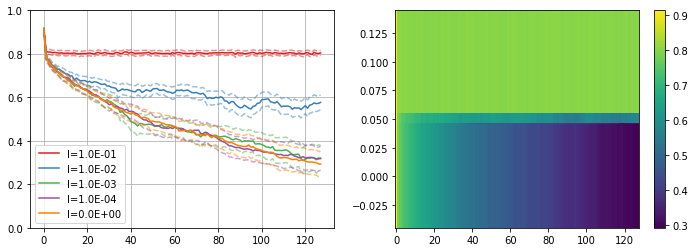

In [369]:
plotter(*o)
# o[0].shape

In [533]:
%%time

ps = 10**np.linspace(-1,-3,4)
# ps = np.concatenate([0]
ps = np.append(ps,0)
# def main(ps=None,**kwargs):
pr = 1
# def prof(env,silent=0,pr=None):
#     BINS = np.linspace(0,1,30)
#     adv = mix_adv(fill_ber,env.adv,pa=pr)
#     hist = sample(env,adv=adv)
#     ending = hist[-1:]
#     if not silent:
#         densi = np.mean(ending,axis=(2,3))
#         plt.hist(hill(densi).flat,BINS)
#         plt.grid()
#     return hist
#     plt.show()
# def main(env,ps=ps):
# #     env = guess(**kwargs)
#     hist = []
#     f = lambda x:prof(env,pr=x,silent=1)
#     hist = map(f,ps)
#     out = np.array(hist)
#     return out,ps

def main(env,ps=ps,agg=np.min):
    lst = []
    for pr in ps:
        adv = mix_adv(fill_ber,env.adv,pa=pr)
        hist = sample(env,adv=adv)
        hist = hist.reshape(hist.shape[:-2]+(-1,))
        dlst=  []
        for x in hist:
            d= spdist.pdist(x,'hamming')
            d = hill(d)
            D = spdist.squareform(d)
            dlst+=[D]        
#         d = spdist.pdist(hist[-1],'hamming')
#         d = hill(d)
#         D = spdist.squareform(d)
            np.fill_diagonal(D,2)    
#         lst.append(D)
        lst.append(agg(dlst,axis=(-1)))
#         lst.append(dlst)
#     lst = np.mean(lst,axis=(-1))
    lst=  np.array(lst)
    return [lst,ps]
def plotter(out,ps,title='',diff=0,ylim=[0,1],nsmooth=1,showerr=1):
    smean = out
    SERR = np.stderr(smean,axis=(-1))*4
#     SERR = np.std(smean,axis=(-1))/2
    MEAN = np.mean(smean,axis=(-1))
    MEAN = movavg(MEAN,nsmooth,axis=(1))
    if diff:
        MEAN = np.diff(MEAN,axis=(1))
        SERR = (SERR[:,1:] + SERR[:,:-1])/4.
#         SERR = (SERR[:,1:] + SERR[:,:-1])/2.
    
#     for xs,ys in zip(MEAN,SERR):
# #         plt.plot(xs,ys)
#         plt.plot(ys)
#         plt.plot(xs)
#     plt.xlim(0,1)
#     plt.ylim(0,0.2)
#     plt.grid()
    if not showerr:
        SERR =  SERR * 0 
    _ ,axs =  plot_lines(MEAN,SERR,ys=ps)
    plt.sca(axs[0])
    plt.ylim(ylim)
    plt.title(title)
    plt.show()
    # STD= smean.std(axis=(-1))
def plotter2(out,ps,title='',diff=1,xlim=None,ylim=[0,1],nsmooth=1,showerr=1):
    smean = out
    SERR = np.stderr(smean,axis=(-1))*4
#     SERR = np.std(smean,axis=(-1))/2
    MEAN = np.mean(smean,axis=(-1))
    MEAN = movavg(MEAN,nsmooth,axis=(1))
    if diff:
        MEANdiff = np.diff(MEAN,axis=(1))
        MEAN = movavg(MEAN,2)[:,1:]   
    for xs,ys in zip(MEAN,MEANdiff):
        plt.plot(xs[0],ys[0],'x')
        plt.plot(xs,ys)
#         plt.plot(ys)
#         plt.plot(xs)
    plt.grid()
#     plt.sca(axs[0])
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.title(title)
    plt.show()
    # STD= smean.std(axis=(-1))
    
ps = 10**np.linspace(-1,-4,4)    
ps = np.append(ps,0)
def f(dct,ps=ps):
    env = guess(dct=dct)
    env.change_size((128,128,32**2))
    return main(env,ps)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 205 µs


<module 'scipy.ndimage.filters' from '/home/shouldsee/.local/lib/python2.7/site-packages/scipy/ndimage/filters.pyc'>

In [472]:
# print 'hi'

hi


In [493]:
import scipy.ndimage.filters as spfilter
def movavg(y, npoint=1, axis=0,mode='reflect'):
    '''
    Moving average along an axis
    '''
    if npoint == 1:
        return y
    shape = [1]*y.ndim
    shape[axis]=npoint 
    fir = np.ones(shape,dtype=np.float)/npoint
    out = spfilter.convolve(y, fir, mode=mode)
    return out
# arr = o[0]
# out = smooth(arr,2,axis=)

In [520]:
%%time
# o = main(env,10**np.linspace(-1,-5,5))
# o = main(env)
o  =f(tst_dct[0])


CPU times: user 7.61 s, sys: 112 ms, total: 7.72 s
Wall time: 7.71 s


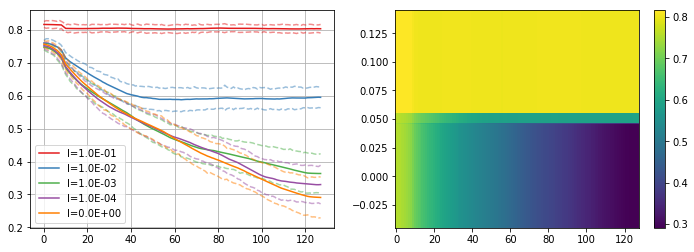

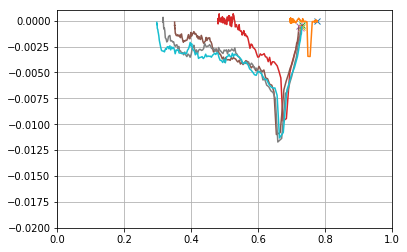

In [538]:
# print o[0].shape
# arr = o[0]
# arr = np.diff(arr,axis=1)
plotter(*o,diff=0,ylim=None,nsmooth=20)
plotG = functools.partial(plotter,diff=1,nsmooth=30,showerr=0, ylim = [-0.02,0.001])
plotG = functools.partial(plotter2,ylim = None,nsmooth=30,xlim=[0,1])
# plotG(*o)
plotter2(*o,nsmooth=30,xlim=[0,1],ylim = [-0.02,0.001])
# plotter(*o,diff=1,nsmooth=20,showerr=0, ylim = [-0.02,0.001])

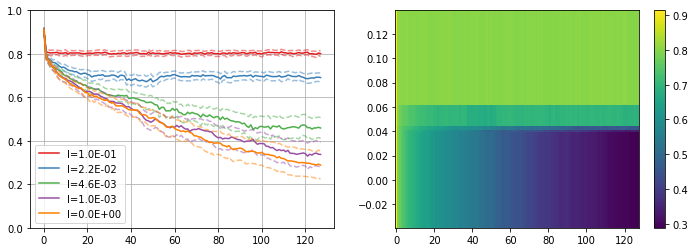

In [423]:
#### Plotting profiles
plotter(*f(tst_dct[0]))


In [424]:
#### Comparing dynamics corresponding to two curves (blue vs green) 

env = guess(dct=tst_dct[0])
a = env.change_size((16,512,128**2))
env.adv = mix_adv(fill_ber,env.adv,pa=2.2E-2)
# env.adv = mix_adv(fill_ber,env.adv,pa=0)
hist = sample(env)
# showsptime(hist[:,0])
# plt.show()
ipd.display(animate(hist[::2,0]))

env = guess(dct=tst_dct[0])
a = env.change_size((16,512,128**2))
env.adv = mix_adv(fill_ber,env.adv,pa=4.6E-3)
# env.adv = mix_adv(fill_ber,env.adv,pa=0)
hist = sample(env)
# showsptime(hist[:,0])
# plt.show()
animate(hist[::2,0])

In [425]:
ani = animate(hist[::2,0],html=0)

In [430]:
ani.save('%s/%s.mp4'%(CDIR,env.rulestr))

In [ ]:
env = guess(dct=tst_dct[16])
a = env.change_size((16,512,128**2))
env.adv = mix_adv(fill_ber,env.adv,pa=2.2E-2)
# env.adv = mix_adv(fill_ber,env.adv,pa=0)
hist = sample(env)
# showsptime(hist[:,0])
# plt.show()
animate(hist[::2,0])

In [ ]:
111110100000111011010000000001010110010100000111011010011101000100110100010000000110011101101011001010
111010000000100011011000000011010110010100000111011010011100000100110101000000000011000101101011001010
111010000000100011011000000011010110010100000111011010011100010100110101000000000011000101101011001010
111000000000100011011000000011010110010100000111011010011100010100110101000000000011000101101011001010
011000000000100011011000000011010110010100000111011010011100010100110101000000000011000101101011001010
011000000000100011011000000011010110010100000111011010011100000100110101000000000011000101101011001010
011000000000100011011000000011010110010100000111011010011000000100110101000000000011000101101011001010
011000000000100011011000000011010110010100000111011010011000000101110101000000000011000101101011001010
011000000000100011011000000011010110010100000111011010011000100101110101000000000011000101101011001010

111110100000111011010000000001010110010100000111011010011101000100110100010000000110011101101011001010
111010000000100011011000000011010110010100000111011010011100000100110101010000001011000101101011001010

In [ ]:
env = guess(dct=tst_dct[23])
a = env.change_size((16,512,128**2))
env.adv = mix_adv(fill_ber,env.adv,pa=3.0E-2)
# env.adv = mix_adv(fill_ber,env.adv,pa=0)
hist = sample(env)
# showsptime(hist[:,0])
# plt.show()
animate(hist[::2,0])

In [ ]:
env = guess(dct=tst_dct[29])
a = env.change_size((16,512,128**2))
env.adv = mix_adv(fill_ber,env.adv,pa=3.0E-2)
# env.adv = mix_adv(fill_ber,env.adv,pa=0)
hist = sample(env)
# showsptime(hist[:,0])
# plt.show()
animate(hist[::2,0])

In [ ]:
env = guess(dct=tst_dct[2])
a = env.change_size((16,512,128**2))
env.adv = mix_adv(fill_ber,env.adv,pa=4.6E-2)
# env.adv = mix_adv(fill_ber,env.adv,pa=0)
hist = sample(env)
# showsptime(hist[:,0])
# plt.show()
animate(hist[::2,0])

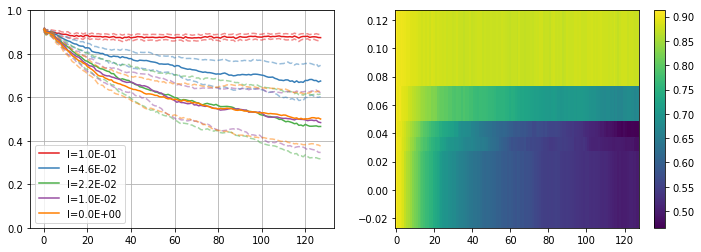

In [395]:
ps = 10**np.linspace(-1,-2,4)
ps = np.append(ps,0)
plotter(*f(tst_dct[15],ps))# ps = np.concatenate([0]


In [512]:
%%time
out = mp_map(f,tst_dct,n_cpu=4)

CPU times: user 140 ms, sys: 440 ms, total: 580 ms
Wall time: 1min


In [ ]:
for i,x in enumerate(out):
    plotter(*x,title=i)
# map(lambda x:plotter(*x),out)

In [550]:
c1='''
0
5
10
11
13
15
16
19
21
26'''
c2='''
6
1
27
31'''
c3='''
3
8
25'''
c4='''
17
18
20
28'''

1.939450E-05 [ 0.84009723 20.49317814  0.07333774]
5.189061E-03 [-0.03458326 23.65225017  1.18124687]
4.615140E-03 [-0.03455249 20.58486617  1.18125673]
4.687483E-03 [-0.03608997 20.75287467  1.1864767 ]
4.579378E-03 [-0.0361123  20.78274509  1.18298482]


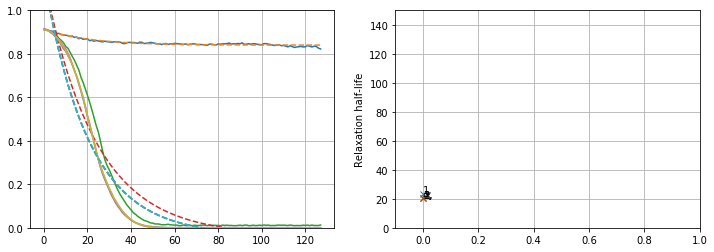

In [690]:

def model_exp(x, x0, bt, c):
    return c*np.exp(x/(-bt)) + x0
#     return c*np.exp(-bt*x) + x0

# ys = arr[0]
def fit_exp(ys,xs = None):
    if xs is None:
        xs=  np.arange(ys.size)
    popt,pcov,yfit = curve_fit_wrapper(model_exp, xs, ys,plot=0)
    loss = np.mean((yfit-ys)**2)
    return popt,yfit,loss
def plotter3(o,ps=None,ylim=[0,150],axs = None,silent=0,lab=''):
    MAX = ylim[1] if ylim else 150     
#     MAX = ylim[1] if ylim else 1 
#     MAX = 0.5
    arr = np.mean(o,axis=-1)
    if axs is None:
        fig,axs= plt.subplots(1,2,figsize=[12,4])
#     xs = np.arange(arr.shape[1])
#     print lab
    for i,ys in enumerate(arr):
        popt,yfit,loss = fit_exp(ys)
        plt.sca(axs[0])
        plt.plot(ys)
        plt.plot(yfit,'--')
        plt.sca(axs[1])
        if not silent:
            print '%3E'%loss,popt
        if popt[2]>.1:
            x,y= max(0,popt[0]),min(popt[1],MAX-10)
            plt.plot(x,y,'x')
#             plt.annotate(lab,xy=(x,y))
            plt.annotate('%d,%s'%(i,lab),xy=(x,y))
#         print popt
#         plt.scatter(popt[0],min(1/popt[1],MAX))
    plt.sca(axs[0])
    plt.ylim(0,1)
    plt.grid()
    plt.sca(axs[1])
    plt.ylabel('Relaxation half-life')
    plt.xlim(-0.1,1)
    plt.ylim(ylim)
    plt.grid()
#     plt.show()
plotter3(o[0])
plt.show()

In [712]:
def main(env,ps=ps,agg=np.min):
#     ps = np.array([0.1   , 0.01  , 0.001 , 0.0001, 0.    ])
    lst = []
    for pr in ps:
        adv = mix_adv(fill_ber,env.adv,pa=pr)
        hist = sample(env,adv=adv)
        hist = hist.reshape(hist.shape[:-2]+(-1,))
        dlst=  []
        for x in hist:
            d= spdist.pdist(x,'hamming')
            d = hill(d)
            D = spdist.squareform(d)
            dlst+=[D]        
            np.fill_diagonal(D,2)    
        lst.append(agg(dlst,axis=(-1)))
    lst=  np.array(lst)
    
    opt = post(lst)
    out = np.vstack([[ps],opt])
    return out
def post(o,ps=None,ylim=[0,150],axs = None,silent=0,lab=''):
    arr = np.mean(o,axis=-1)
    out = map(lambda x:fit_exp(x)[0],arr) 
    #### out = (popt,yfit,loss)
    return zip(*out)
def worker0325(**kwargs):
    env = KBs.guess(kwargs)
    env.change_size((128,128,32**2))
    out = main(env)
    return out

/home/shouldsee/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in exp
  This is separate from the ipykernel package so we can avoid doing imports until


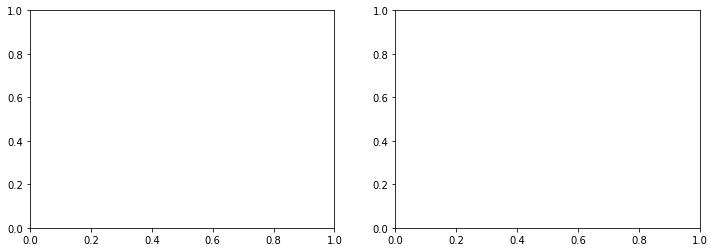

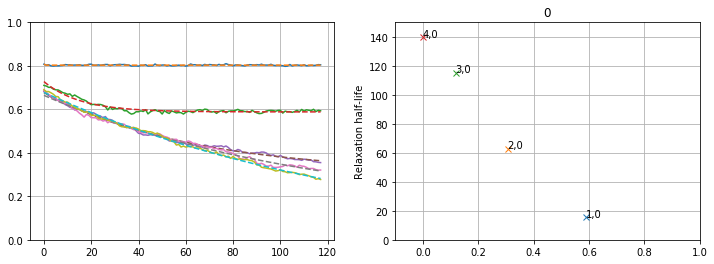

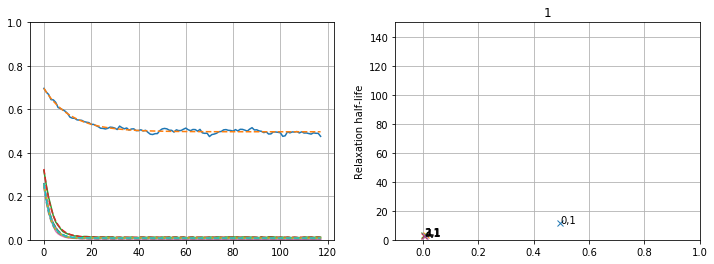

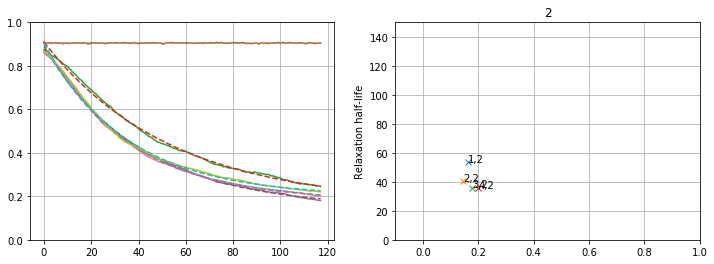

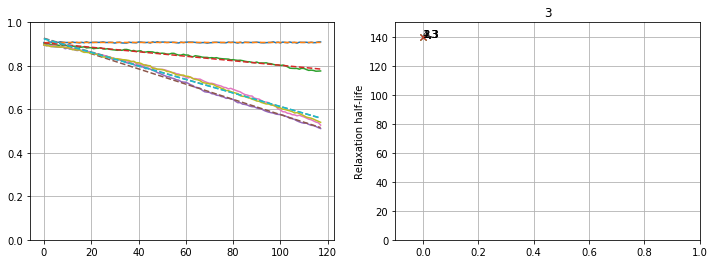

...

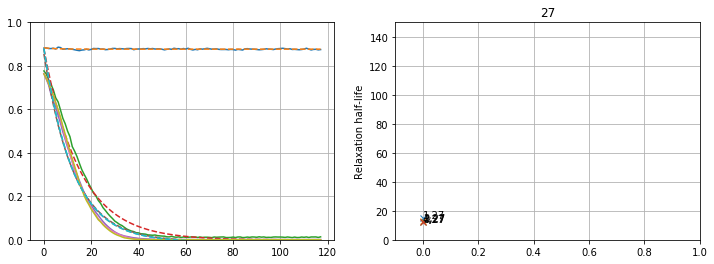

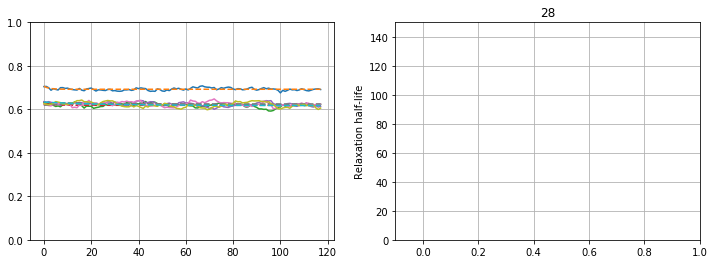

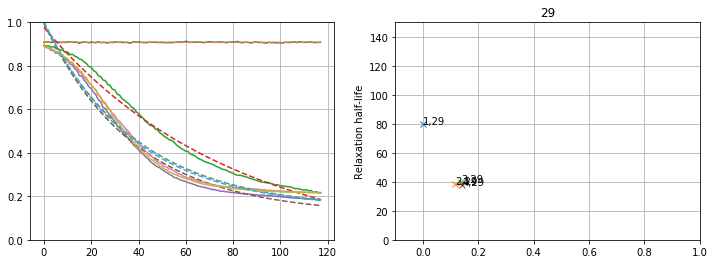

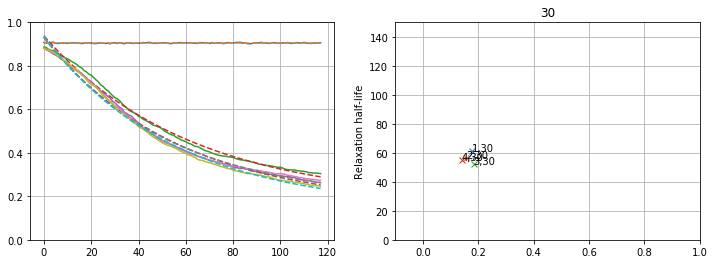

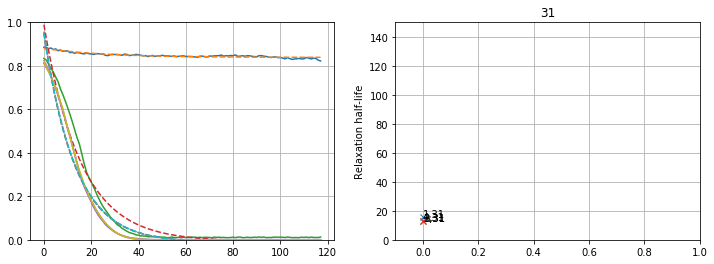

In [714]:
l = c4 + c1
l = [int(x) for x in l.splitlines() if x]
# for x in l:
fig,axs= plt.subplots(1,2,figsize=[12,4])

for x in range(len(out)):
#     plotter(*out[x],title=x)
    o = out[x]
#     plotter(o[0][:],o[1],title=x)
#     plotG(o[0][:],o[1],title=x)
    plotter3(out[x][0][:,10:],axs = None,silent=1,lab=str(x))
#     plotter3(out[x][0][:,10:],axs = axs,silent=1,lab=str(x))
#     plotG(*out[x],title=x)
    plt.title(x)
    plt.show()
# plt.show()
    


In [697]:
print c1


0
5
10
11
13
15
16
19
21
26


In [ ]:
lview(tst_env[17])

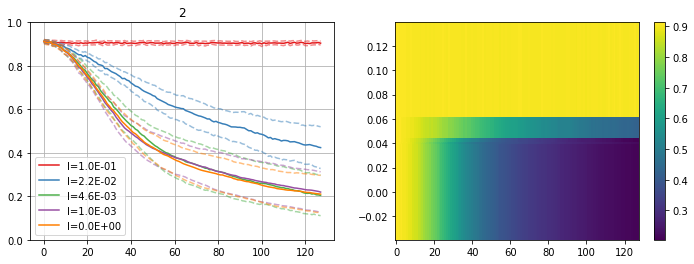

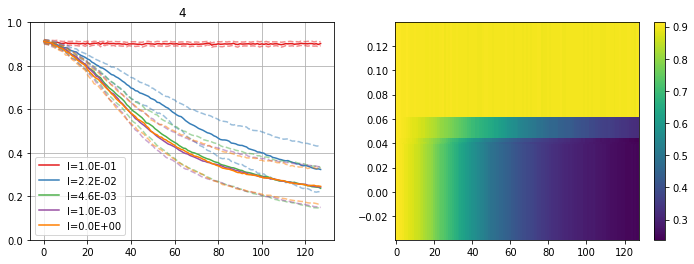

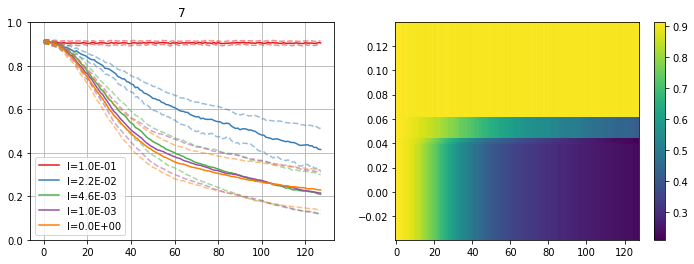

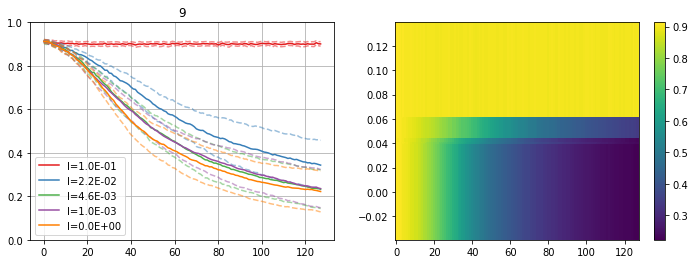

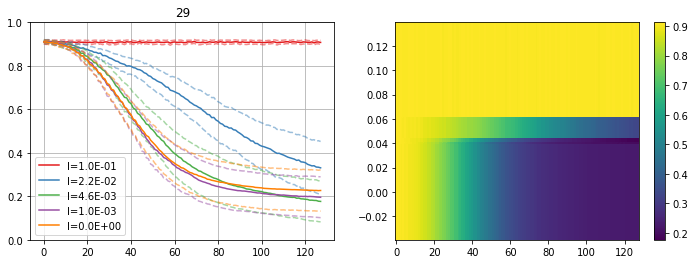

...

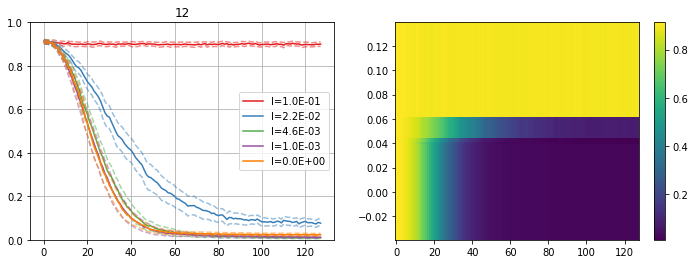

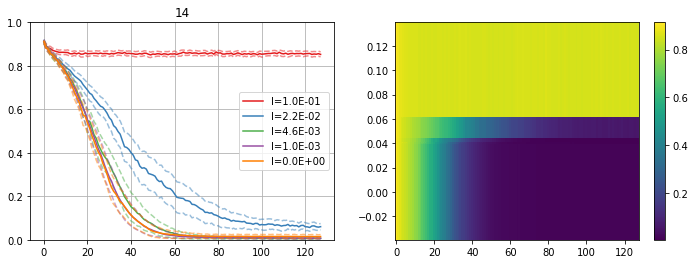

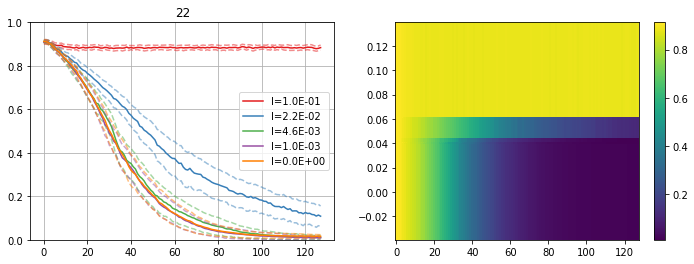

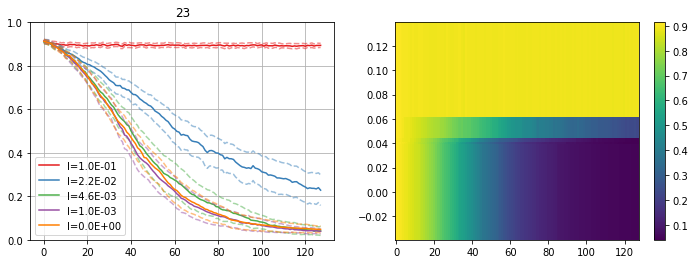

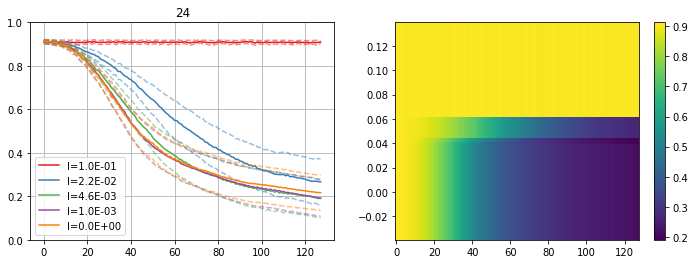

In [392]:
l = '''
2
4
7
9
29
30
12
14
22
23
24
'''
l = [int(x) for x in l.splitlines() if x]
for x in l:
    plotter(*out[x],title=x)


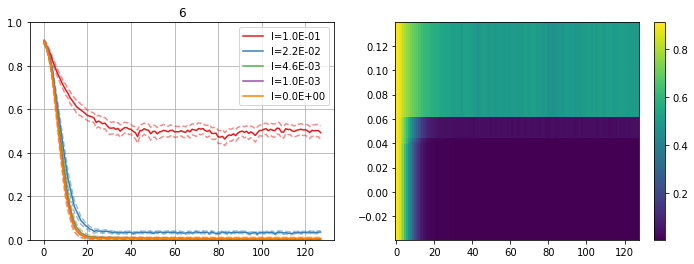

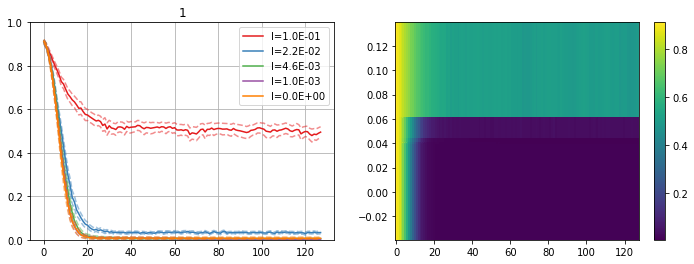

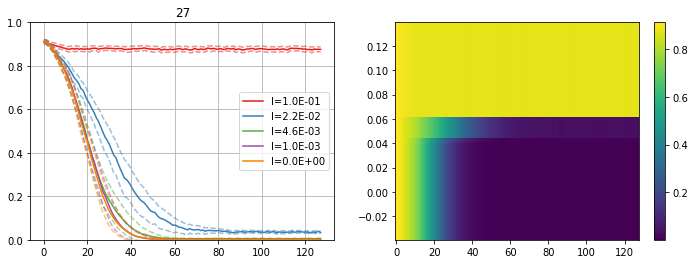

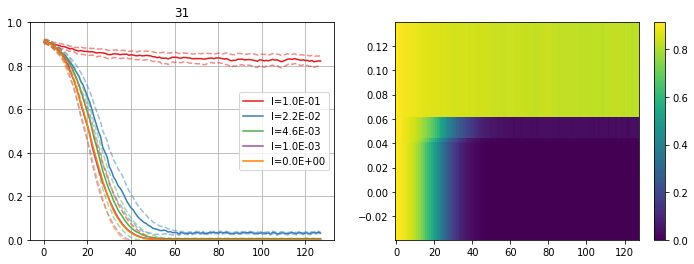

In [391]:
l = '''
6
1
27
31
'''
l = [int(x) for x in l.splitlines() if x]
for x in l:
    plotter(*out[x],title=x)


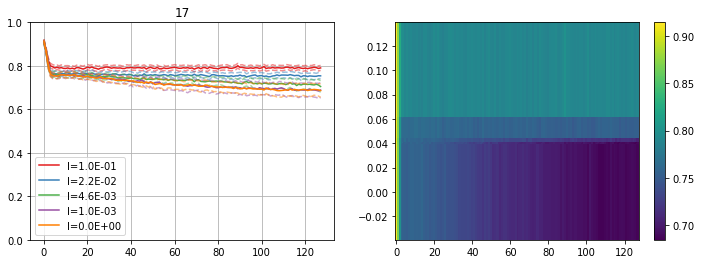

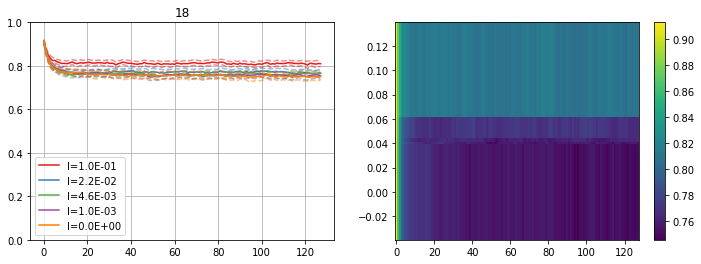

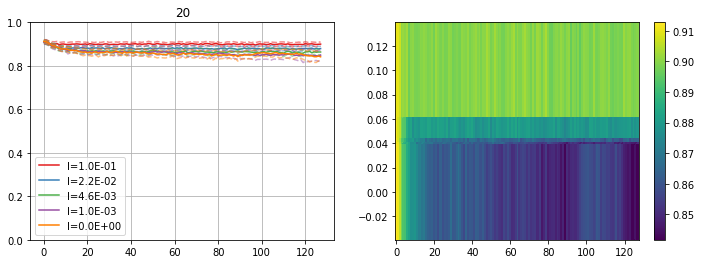

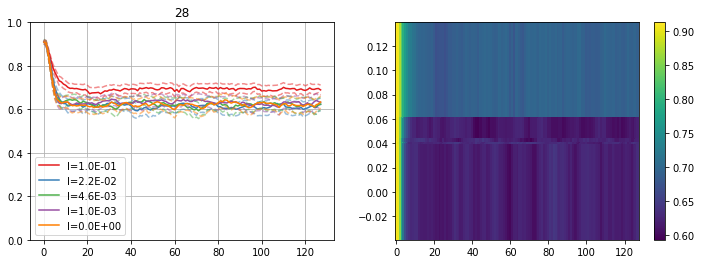

In [394]:
l = '''
17
18
20
28
'''
l = [int(x) for x in l.splitlines() if x]
for x in l:
    plotter(*out[x],title=x)


In [381]:
# print 
# print t
# lview(guess(dct=tst_dct[3]))
lview(tst_env[7])
# out[3][]

http://newflaw.com/view.php?rule_alias=b1ce03cijnq2ak5acinqr4aceijy7c6aikn8s1c03aejkn2aeikn5y4cjknqrtz6n


'http://newflaw.com/view.php?rule_alias=b1ce03cijnq2ak5acinqr4aceijy7c6aikn8s1c03aejkn2aeikn5y4cjknqrtz6n'

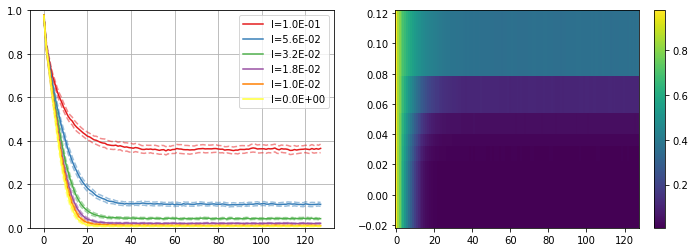

In [235]:
map(plotter(*f(tst_dct[x])),range(len(tst_dct)))

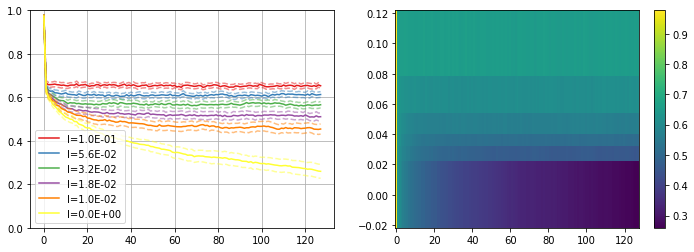

In [234]:
plotter(*f(tst_dct[5]))

In [ ]:
def adv(a,horizon=0):
    return ruleprj[self.conv(a)]